In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
ar=pd.read_csv(r'C:\Users\Adarshdeep Gupta\Downloads\archive(1)\AirQuality.csv',sep=';')
ar.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN


In [3]:
ar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


In [4]:
#Dropping Unnamed:15 and Unnamed:16 as they are empty 
ar.drop(['Unnamed: 15','Unnamed: 16'], axis=1, inplace=True)

In [5]:
#Formatting some object columns from strings to floats

ar.replace(to_replace=',',value='.',regex=True,inplace=True) 

for i in 'CO(GT) C6H6(GT) T RH AH'.split():
    ar[i] = pd.to_numeric(ar[i],errors='coerce')

In [6]:
print(ar)

            Date      Time  CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  \
0     10/03/2004  18.00.00     2.6       1360.0     150.0      11.9   
1     10/03/2004  19.00.00     2.0       1292.0     112.0       9.4   
2     10/03/2004  20.00.00     2.2       1402.0      88.0       9.0   
3     10/03/2004  21.00.00     2.2       1376.0      80.0       9.2   
4     10/03/2004  22.00.00     1.6       1272.0      51.0       6.5   
...          ...       ...     ...          ...       ...       ...   
9466         NaN       NaN     NaN          NaN       NaN       NaN   
9467         NaN       NaN     NaN          NaN       NaN       NaN   
9468         NaN       NaN     NaN          NaN       NaN       NaN   
9469         NaN       NaN     NaN          NaN       NaN       NaN   
9470         NaN       NaN     NaN          NaN       NaN       NaN   

      PT08.S2(NMHC)  NOx(GT)  PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)  \
0            1046.0    166.0        1056.0    113.0        1692.0   
1        

In [7]:
for column in ar.columns[2:]:
    negative_values = ar[ar[column] < 0]
    
    if not negative_values.empty:
        print(f"Column '{column}' has negative values:")
        
        # Create a dictionary to store counts of negative values
        negative_counts = {}
        
        for index, value in negative_values.iterrows():
            value = value[column]
            if value in negative_counts:
                negative_counts[value] += 1
            else:
                negative_counts[value] = 1
        
        for value, count in negative_counts.items():
            print(f"Negative value {value} occurred {count} times")

Column 'CO(GT)' has negative values:
Negative value -200.0 occurred 1683 times
Column 'PT08.S1(CO)' has negative values:
Negative value -200.0 occurred 366 times
Column 'NMHC(GT)' has negative values:
Negative value -200.0 occurred 8443 times
Column 'C6H6(GT)' has negative values:
Negative value -200.0 occurred 366 times
Column 'PT08.S2(NMHC)' has negative values:
Negative value -200.0 occurred 366 times
Column 'NOx(GT)' has negative values:
Negative value -200.0 occurred 1639 times
Column 'PT08.S3(NOx)' has negative values:
Negative value -200.0 occurred 366 times
Column 'NO2(GT)' has negative values:
Negative value -200.0 occurred 1642 times
Column 'PT08.S4(NO2)' has negative values:
Negative value -200.0 occurred 366 times
Column 'PT08.S5(O3)' has negative values:
Negative value -200.0 occurred 366 times
Column 'T' has negative values:
Negative value -200.0 occurred 366 times
Negative value -0.1 occurred 2 times
Negative value -0.3 occurred 1 times
Negative value -0.6 occurred 2 tim

In [8]:
#We can infer -200 has been taken inplace of NAN value in dataset

In [9]:
#Replacing null data from -200 to NaN for posterior treatment

ar.replace(to_replace=-200,value=np.nan,inplace=True)

In [10]:
#Formatting Date and Time to datetime type

ar['Date'] = pd.to_datetime(ar['Date'],dayfirst=True) 

ar['Time'] = pd.to_datetime(ar['Time'],format= '%H.%M.%S' ).dt.time

ar.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [11]:
for column in ar.columns[2:]:
    ratio = ar[column].isna().sum()/len(ar[column])
    ratio=ratio*100
    print(f"Column '{column}' has ratio of NAN values as : '{ratio}'")

Column 'CO(GT)' has ratio of NAN values as : '18.973709217611656'
Column 'PT08.S1(CO)' has ratio of NAN values as : '5.068102629078239'
Column 'NMHC(GT)' has ratio of NAN values as : '90.34948791046352'
Column 'C6H6(GT)' has ratio of NAN values as : '5.068102629078239'
Column 'PT08.S2(NMHC)' has ratio of NAN values as : '5.068102629078239'
Column 'NOx(GT)' has ratio of NAN values as : '18.509133143279485'
Column 'PT08.S3(NOx)' has ratio of NAN values as : '5.068102629078239'
Column 'NO2(GT)' has ratio of NAN values as : '18.540808784711224'
Column 'PT08.S4(NO2)' has ratio of NAN values as : '5.068102629078239'
Column 'PT08.S5(O3)' has ratio of NAN values as : '5.068102629078239'
Column 'T' has ratio of NAN values as : '5.068102629078239'
Column 'RH' has ratio of NAN values as : '5.068102629078239'
Column 'AH' has ratio of NAN values as : '5.068102629078239'


In [12]:
#We can observe there is high presence of NAN value in NMHC(GT) 
#Removing NMHC(GT) sensor due to amount of null values

ar.drop('NMHC(GT)', axis=1, inplace=True) 

ar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9357 non-null   datetime64[ns]
 1   Time           9357 non-null   object        
 2   CO(GT)         7674 non-null   float64       
 3   PT08.S1(CO)    8991 non-null   float64       
 4   C6H6(GT)       8991 non-null   float64       
 5   PT08.S2(NMHC)  8991 non-null   float64       
 6   NOx(GT)        7718 non-null   float64       
 7   PT08.S3(NOx)   8991 non-null   float64       
 8   NO2(GT)        7715 non-null   float64       
 9   PT08.S4(NO2)   8991 non-null   float64       
 10  PT08.S5(O3)    8991 non-null   float64       
 11  T              8991 non-null   float64       
 12  RH             8991 non-null   float64       
 13  AH             8991 non-null   float64       
dtypes: datetime64[ns](1), float64(12), object(1)
memory usage: 1.0+ MB


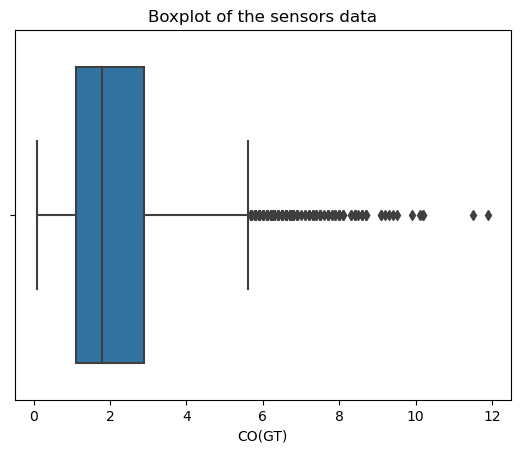

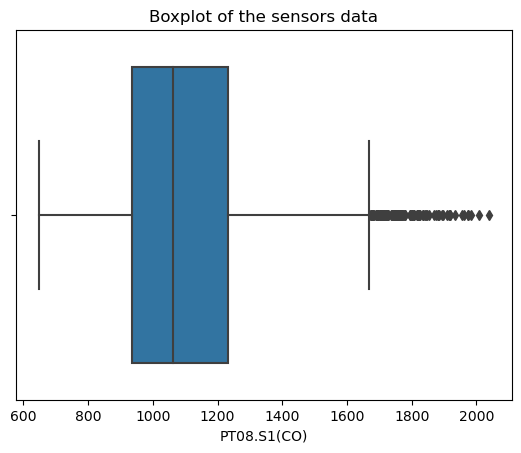

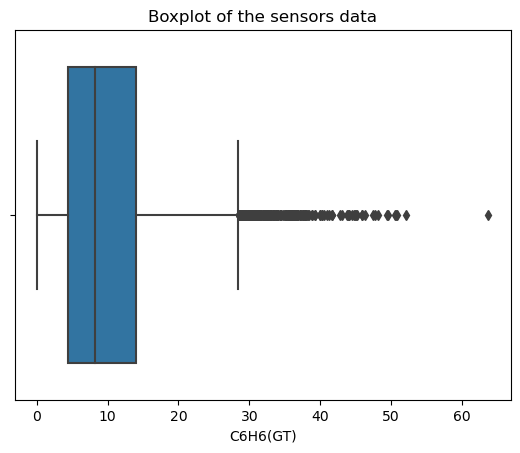

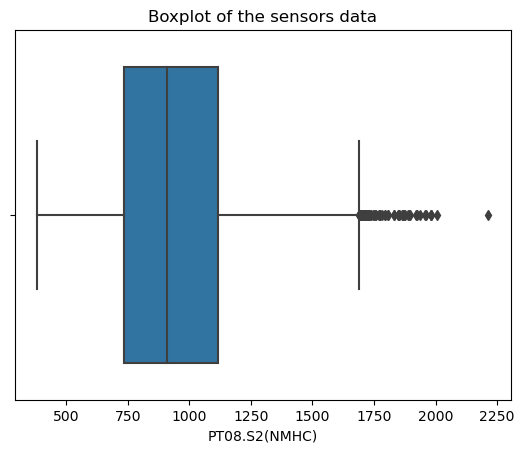

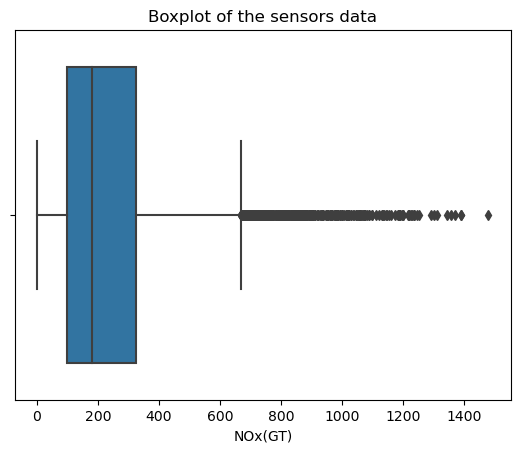

...

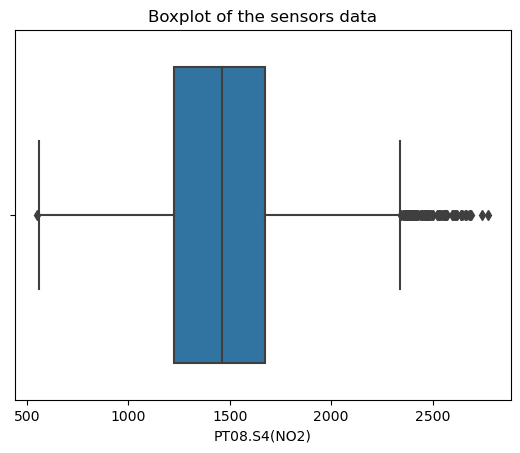

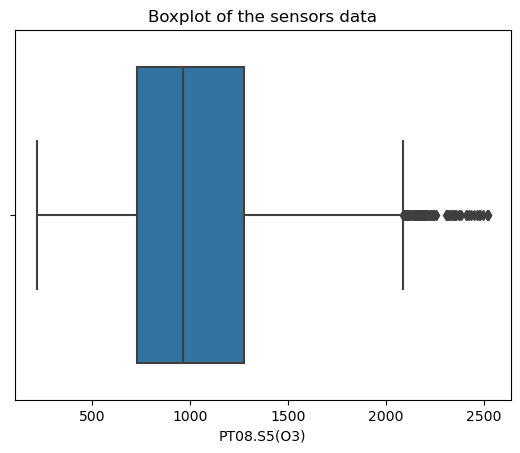

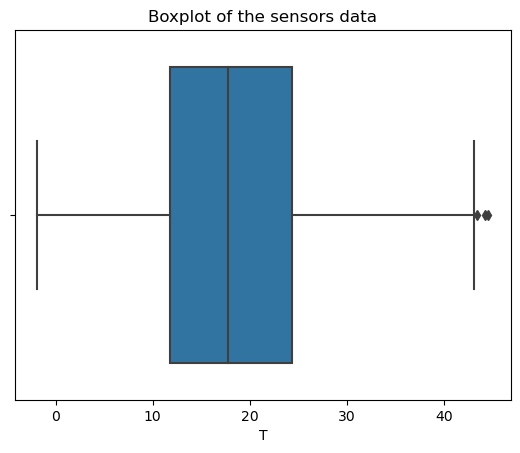

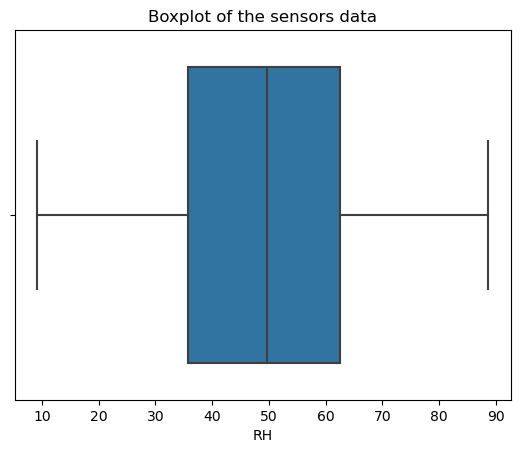

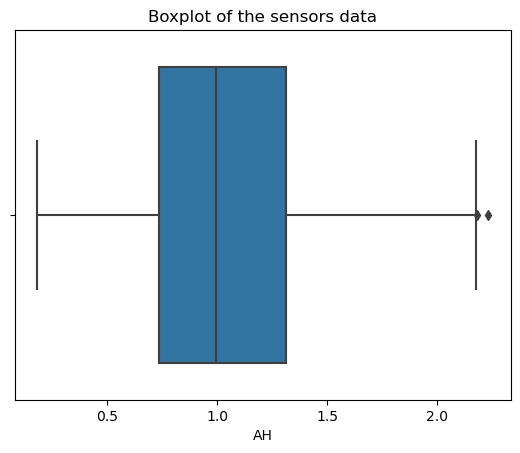

In [13]:
for i in ar.columns[2:]:
    sns.boxplot(x=ar[i])
    plt.title('Boxplot of the sensors data')
    plt.show()

In [14]:
ar.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [20]:
#Adjusting date and time column for efficient use in future code. 

col_to_move = ar.pop(ar.columns[3])
#col_to_move1 = ar.pop(ar.columns[2])


#ar.insert(0, col_to_move.name, col_to_move)
ar.insert(1, col_to_move.name, col_to_move)

In [21]:
ar.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


In [22]:
#Removing Outliers with the Interquartile Range Method (IQR)

Q1 = ar.quantile(0.25) #first 25% of the data
Q3 = ar.quantile(0.75) #first 75% of the data
IQR = Q3 - Q1 #IQR = InterQuartile Range

scale = 2 #For Normal Distributions, scale = 1.5
lower_lim = Q1 - scale*IQR
upper_lim = Q3 + scale*IQR



lower_outliers = (ar[ar.columns[2:13]] < lower_lim)
upper_outliers = (ar[ar.columns[2:13]] > upper_lim)

C:\Users\Adarshdeep Gupta\AppData\Local\Temp\ipykernel_10076\3513166261.py:13: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  lower_outliers = (ar[ar.columns[2:13]] < lower_lim)
C:\Users\Adarshdeep Gupta\AppData\Local\Temp\ipykernel_10076\3513166261.py:14: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  upper_outliers = (ar[ar.columns[2:13]] > upper_lim)


In [23]:
#Checking the resulting outliers calculated by the above method 
#(represented below as non-null values)

ar[ar.columns[2:]][(lower_outliers | upper_outliers)].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         102 non-null    float64
 1   PT08.S1(CO)    30 non-null     float64
 2   C6H6(GT)       105 non-null    float64
 3   PT08.S2(NMHC)  13 non-null     float64
 4   NOx(GT)        244 non-null    float64
 5   PT08.S3(NOx)   114 non-null    float64
 6   NO2(GT)        32 non-null     float64
 7   PT08.S4(NO2)   20 non-null     float64
 8   PT08.S5(O3)    17 non-null     float64
 9   T              0 non-null      float64
 10  RH             0 non-null      float64
 11  AH             0 non-null      float64
dtypes: float64(12)
memory usage: 888.0 KB


In [24]:
#Create new DataFrame without the outliers

num_cols = list(ar.columns[2:])
ar_out_IQR = ar[~((ar[num_cols] < (Q1 - 2 * IQR)) |(ar[num_cols] > (Q3 + 2 * IQR))).any(axis=1)]
ar_out_IQR.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9016 entries, 0 to 9470
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8902 non-null   datetime64[ns]
 1   Time           8902 non-null   object        
 2   CO(GT)         7261 non-null   float64       
 3   PT08.S1(CO)    8583 non-null   float64       
 4   C6H6(GT)       8583 non-null   float64       
 5   PT08.S2(NMHC)  8583 non-null   float64       
 6   NOx(GT)        7301 non-null   float64       
 7   PT08.S3(NOx)   8583 non-null   float64       
 8   NO2(GT)        7298 non-null   float64       
 9   PT08.S4(NO2)   8583 non-null   float64       
 10  PT08.S5(O3)    8583 non-null   float64       
 11  T              8583 non-null   float64       
 12  RH             8583 non-null   float64       
 13  AH             8583 non-null   float64       
dtypes: datetime64[ns](1), float64(12), object(1)
memory usage: 1.0+ MB


In [25]:
#Removing CO(GT) and NOx(GT) and NO2(GT) sensor data due the ammount 
#of null values if compared to other sensors

pd.options.mode.chained_assignment = None
ar_out_IQR.drop(['CO(GT)','NOx(GT)','NO2(GT)'],axis=1, inplace=True)
ar_out_IQR.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9016 entries, 0 to 9470
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8902 non-null   datetime64[ns]
 1   Time           8902 non-null   object        
 2   PT08.S1(CO)    8583 non-null   float64       
 3   C6H6(GT)       8583 non-null   float64       
 4   PT08.S2(NMHC)  8583 non-null   float64       
 5   PT08.S3(NOx)   8583 non-null   float64       
 6   PT08.S4(NO2)   8583 non-null   float64       
 7   PT08.S5(O3)    8583 non-null   float64       
 8   T              8583 non-null   float64       
 9   RH             8583 non-null   float64       
 10  AH             8583 non-null   float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 845.2+ KB


In [26]:
ar_out_IQR.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 9016 entries, 0 to 9470
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8902 non-null   datetime64[ns]
 1   Time           8902 non-null   object        
 2   PT08.S1(CO)    8583 non-null   float64       
 3   C6H6(GT)       8583 non-null   float64       
 4   PT08.S2(NMHC)  8583 non-null   float64       
 5   PT08.S3(NOx)   8583 non-null   float64       
 6   PT08.S4(NO2)   8583 non-null   float64       
 7   PT08.S5(O3)    8583 non-null   float64       
 8   T              8583 non-null   float64       
 9   RH             8583 non-null   float64       
 10  AH             8583 non-null   float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 845.2+ KB


In [27]:
#Eliminating rows with NaN values 

ar_filt = ar_out_IQR.dropna(how='any', axis=0)
ar_filt.reset_index(drop=True,inplace=True)
ar_filt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8583 entries, 0 to 8582
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8583 non-null   datetime64[ns]
 1   Time           8583 non-null   object        
 2   PT08.S1(CO)    8583 non-null   float64       
 3   C6H6(GT)       8583 non-null   float64       
 4   PT08.S2(NMHC)  8583 non-null   float64       
 5   PT08.S3(NOx)   8583 non-null   float64       
 6   PT08.S4(NO2)   8583 non-null   float64       
 7   PT08.S5(O3)    8583 non-null   float64       
 8   T              8583 non-null   float64       
 9   RH             8583 non-null   float64       
 10  AH             8583 non-null   float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 737.7+ KB


In [28]:
#Adding a column with the week days 

ar_filt['Week Day'] = ar_filt['Date'].dt.day_name() 

#Rearranging columns

cols = ar_filt.columns.tolist()
cols = cols[:1] + cols[-1:] + cols[1:11]
ar_filt = ar_filt[cols]
ar_filt.head(10)

,Date,Week Day,Time,PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10,Wednesday,18:00:00,1360.0,11.9,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10,Wednesday,19:00:00,1292.0,9.4,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10,Wednesday,20:00:00,1402.0,9.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10,Wednesday,21:00:00,1376.0,9.2,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10,Wednesday,22:00:00,1272.0,6.5,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888
5,2004-03-10,Wednesday,23:00:00,1197.0,4.7,750.0,1337.0,1393.0,949.0,11.2,59.2,0.7848
6,2004-03-11,Thursday,00:00:00,1185.0,3.6,690.0,1462.0,1333.0,733.0,11.3,56.8,0.7603
7,2004-03-11,Thursday,01:00:00,1136.0,3.3,672.0,1453.0,1333.0,730.0,10.7,60.0,0.7702
8,2004-03-11,Thursday,02:00:00,1094.0,2.3,609.0,1579.0,1276.0,620.0,10.7,59.7,0.7648
9,2004-03-11,Thursday,07:00:00,1144.0,3.2,667.0,1490.0,1339.0,730.0,10.2,59.6,0.7417


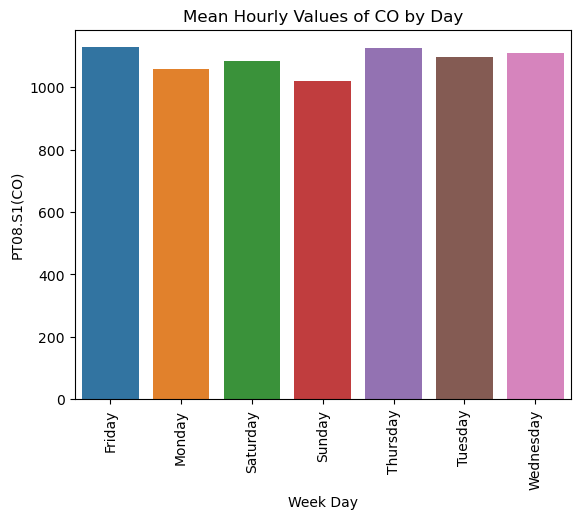

In [29]:

# Group the data by 'Week Day' and calculate the mean of 'PT08.S1(CO)' for each group
grouped_data = ar_filt.groupby('Week Day')['PT08.S1(CO)'].mean().reset_index()

# Plot the mean hourly values for each day
sns.barplot(x='Week Day', y='PT08.S1(CO)', data=grouped_data)
plt.title('Mean Hourly Values of CO by Day')
plt.xticks(rotation=90)
plt.show()

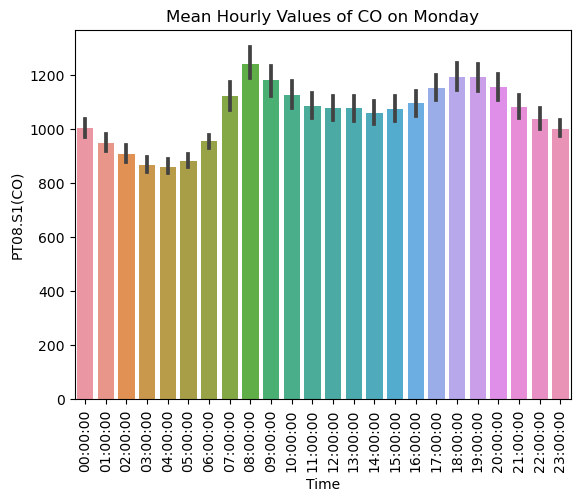

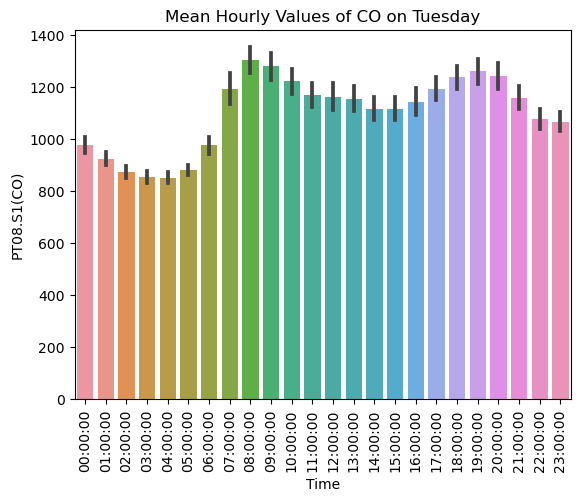

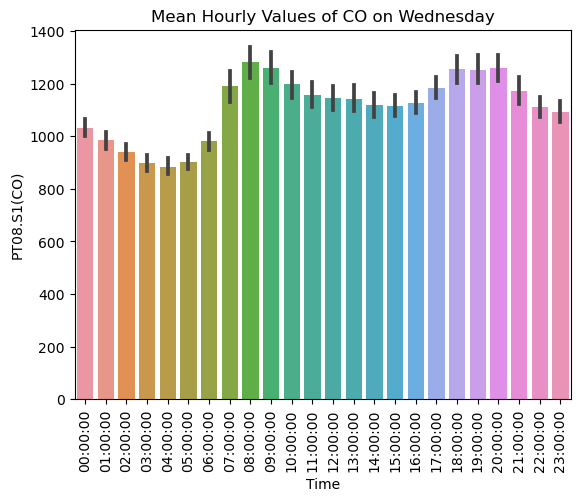

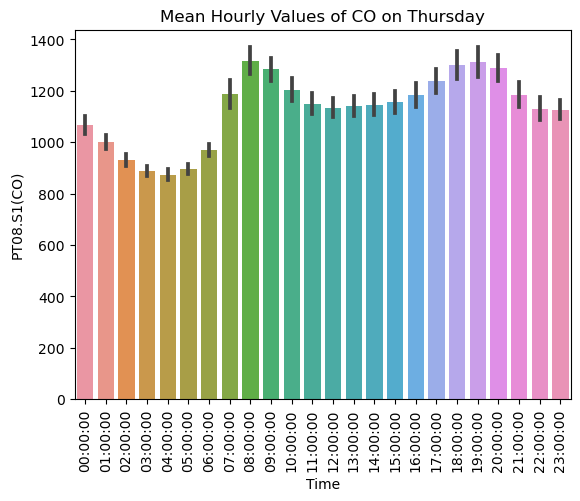

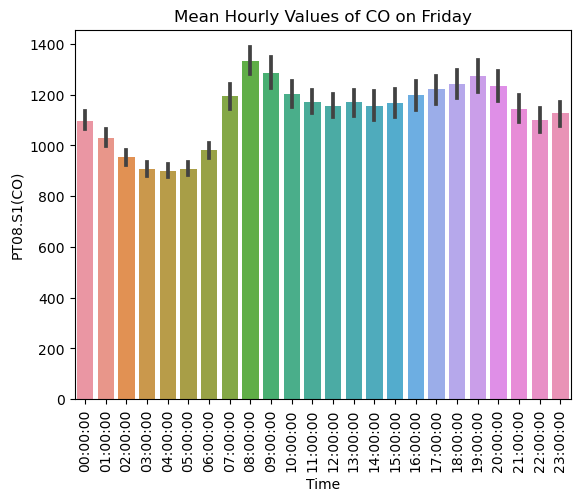

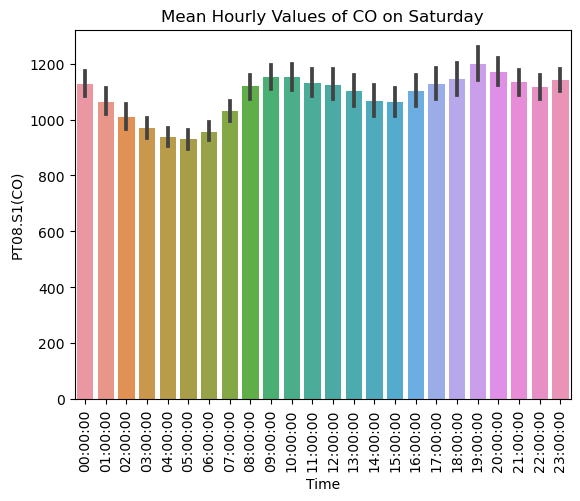

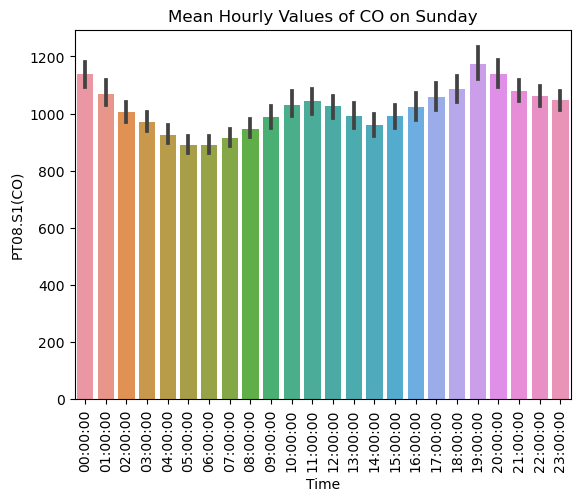

In [30]:
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
for j in days:
    day_data=ar_filt[ar_filt['Week Day'] == j ]
    day=j;
    sns.barplot(x='Time',y='PT08.S1(CO)', data=day_data.sort_values('Time'))
    plt.title(f'Mean Hourly Values of CO on {day}')
    plt.xticks(rotation=90)
    plt.show()

In [31]:
#The peak concentration of CO in the city are between 8 AM and 9 AM and between 6 PM and 8 PM,
#beginnings and endings of office hours, respectively.

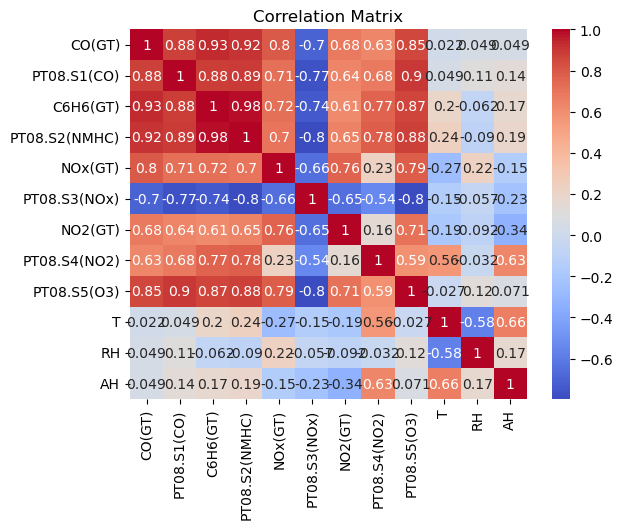

In [32]:
#Plotting correlation matrix

sns.heatmap(ar.corr(),annot=True,cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

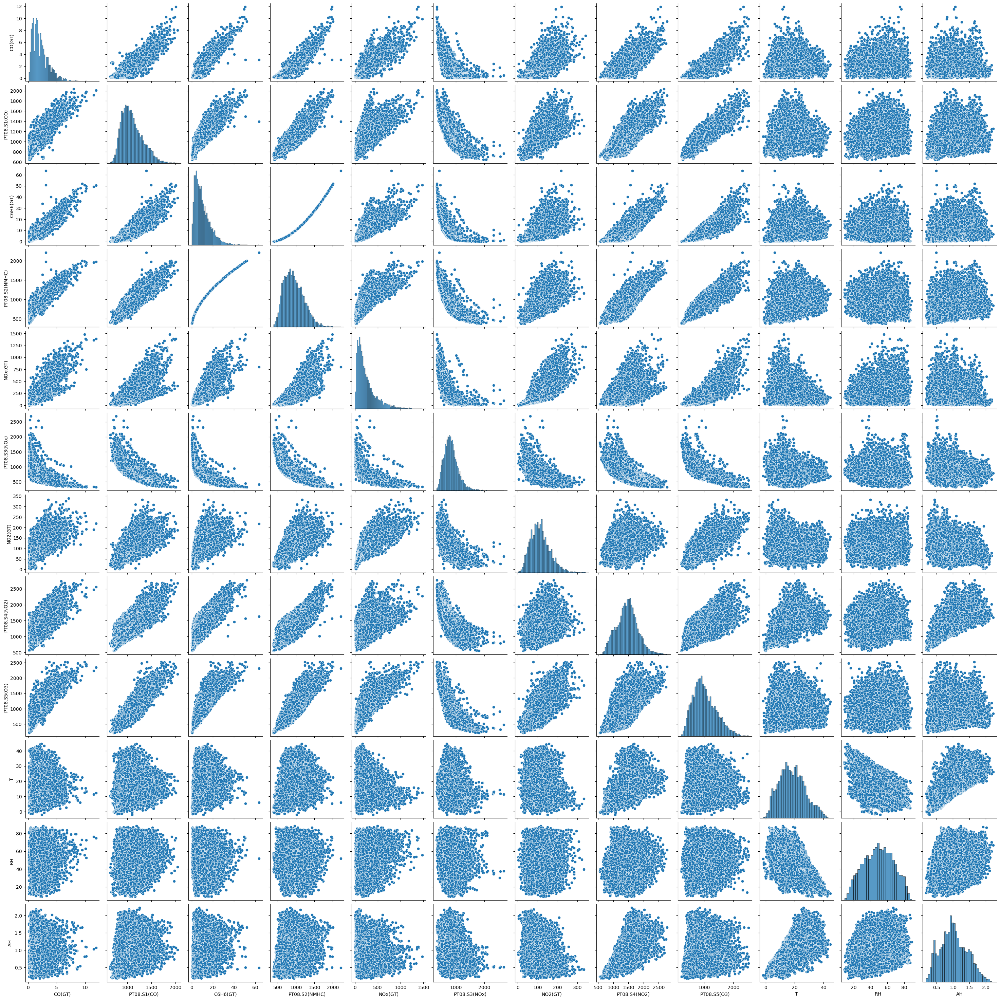

In [33]:
sns.pairplot(ar)
plt.show()

In [34]:

#Extracting season information from Date column:

def season(date):
    year = str(date.year)
    seasons = {'spring': pd.date_range(start='21/03/'+year, end='20/06/'+year),
               'summer': pd.date_range(start='21/06/'+year, end='22/09/'+year),
               'autumn': pd.date_range(start='23/09/'+year, end='20/12/'+year)}
    if date in seasons['spring']:
        return 'spring'
    if date in seasons['summer']:
        return 'summer'
    if date in seasons['autumn']:
        return 'autumn'
    else:
        return 'winter'

ar_filt['Season'] = ar_filt['Date'].map(season)
ar_filt.head(10)

C:\Anaconda\lib\site-packages\pandas\core\base.py:880: UserWarning: Parsing '21/03/2004' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  new_values = map_f(values, mapper)
C:\Anaconda\lib\site-packages\pandas\core\base.py:880: UserWarning: Parsing '20/06/2004' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  new_values = map_f(values, mapper)
C:\Anaconda\lib\site-packages\pandas\core\base.py:880: UserWarning: Parsing '21/06/2004' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  new_values = map_f(values, mapper)
C:\Anaconda\lib\site-packages\pandas\core\base.py:880: UserWarning: Parsing '22/09/2004' in DD/MM/YYYY format. Provide format or specify infer_datetime_format=True for consistent parsing.
  new_values = map_f(values, mapper)
C:\Anaconda\lib\site-packages\pandas\core\base.py:880: UserWarning: Parsing '23/09/2004' in DD/MM/YY

,Date,Week Day,Time,PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),PT08.S3(NOx),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Season
0,2004-03-10,Wednesday,18:00:00,1360.0,11.9,1046.0,1056.0,1692.0,1268.0,13.6,48.9,0.7578,winter
1,2004-03-10,Wednesday,19:00:00,1292.0,9.4,955.0,1174.0,1559.0,972.0,13.3,47.7,0.7255,winter
2,2004-03-10,Wednesday,20:00:00,1402.0,9.0,939.0,1140.0,1555.0,1074.0,11.9,54.0,0.7502,winter
3,2004-03-10,Wednesday,21:00:00,1376.0,9.2,948.0,1092.0,1584.0,1203.0,11.0,60.0,0.7867,winter
4,2004-03-10,Wednesday,22:00:00,1272.0,6.5,836.0,1205.0,1490.0,1110.0,11.2,59.6,0.7888,winter
5,2004-03-10,Wednesday,23:00:00,1197.0,4.7,750.0,1337.0,1393.0,949.0,11.2,59.2,0.7848,winter
6,2004-03-11,Thursday,00:00:00,1185.0,3.6,690.0,1462.0,1333.0,733.0,11.3,56.8,0.7603,winter
7,2004-03-11,Thursday,01:00:00,1136.0,3.3,672.0,1453.0,1333.0,730.0,10.7,60.0,0.7702,winter
8,2004-03-11,Thursday,02:00:00,1094.0,2.3,609.0,1579.0,1276.0,620.0,10.7,59.7,0.7648,winter
9,2004-03-11,Thursday,07:00:00,1144.0,3.2,667.0,1490.0,1339.0,730.0,10.2,59.6,0.7417,winter


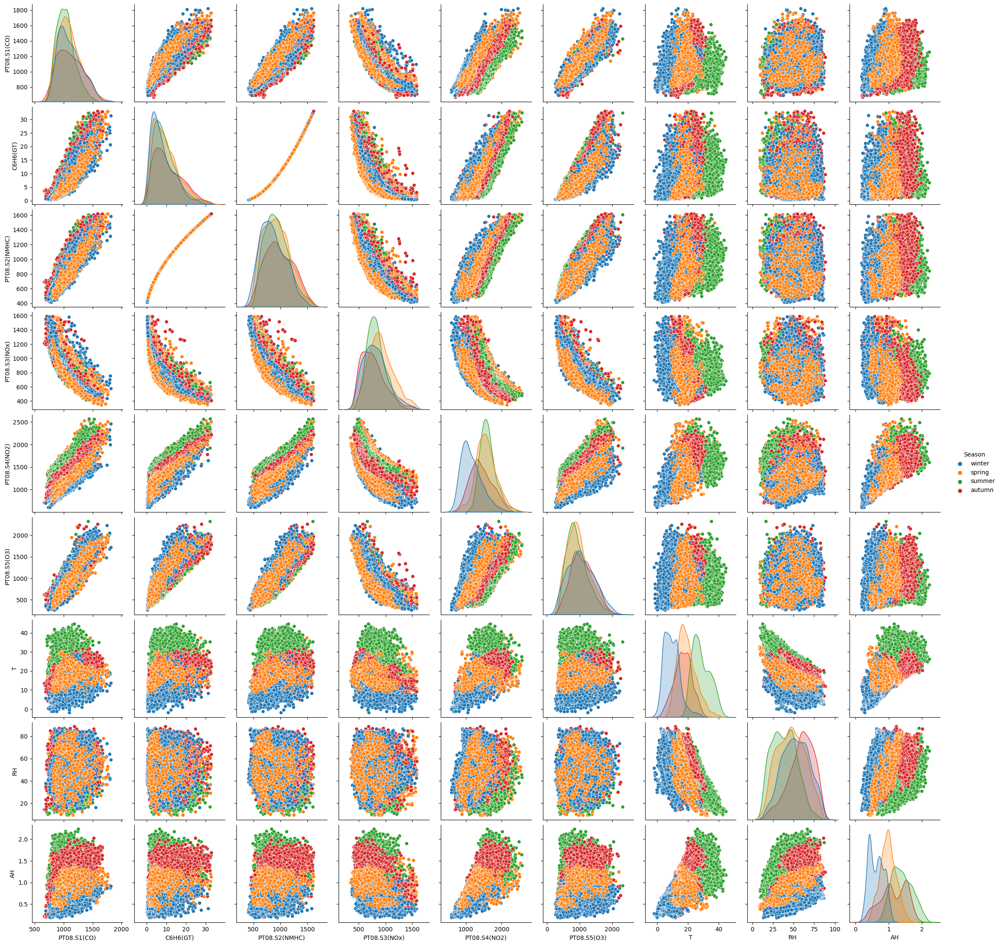

In [35]:
sns.pairplot(ar_filt, hue='Season')
plt.show()